I started the week a bit sick, so I have mainly been resting, and watching a youtube lecture series about numerical flow modeling. 

The goals for this week are to implement a mass conserving target solution, check if my current flux implementation actually computes fluxes, and try to implement strict energy dissipation into the model.

I start by implementing a finite volume based solver for the 1D burgers equation. This was actually a bit trickier than I thought. I used rusanov numerical flux, and SSPRK3 timestepping.

Mass is now being almost perfectly conserved. Somehow the timesteps need to be much lower for the method to work, otherwise it blows up. We can also see that some slight differences in the animation, which is to be expected. We also dont see the slight oscillations in the at the high velocity points.

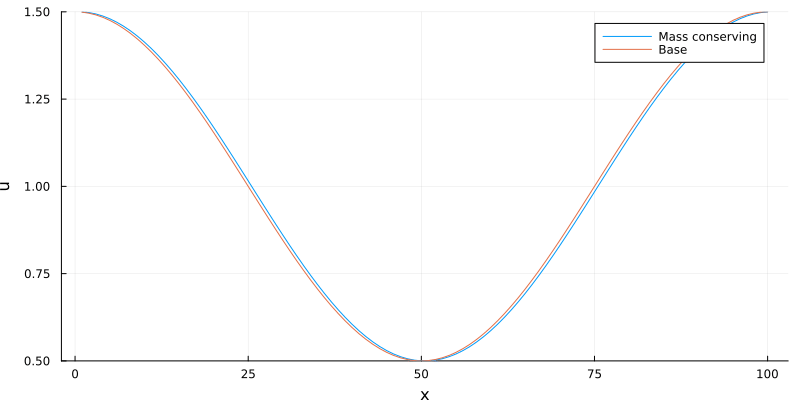

In [1]:
display("image/gif", read("media/Mass_conserving_comp.gif"))

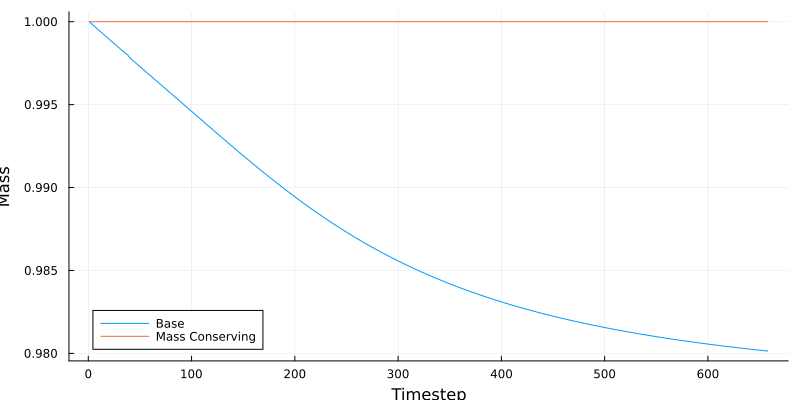

In [4]:
display("image/png", read("media/Mass_conserving_comp.png"))

I now train the flux prediction model on this mass conserving target data.

We now get the best result so far. An order or magnitude more accurate than before. There is still a big downside to the flux prediction model, there is a large chance of the solution blowing up through oscillations. Trying different seeds can give very different results.

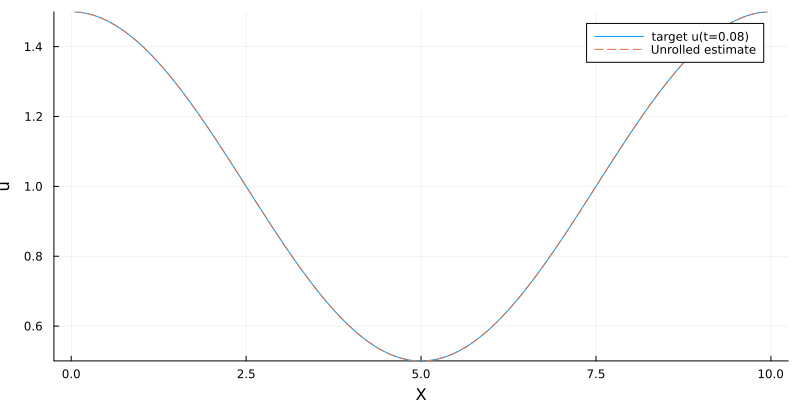

In [3]:
display("image/gif", read("media/flux_mass_conserving.gif"))

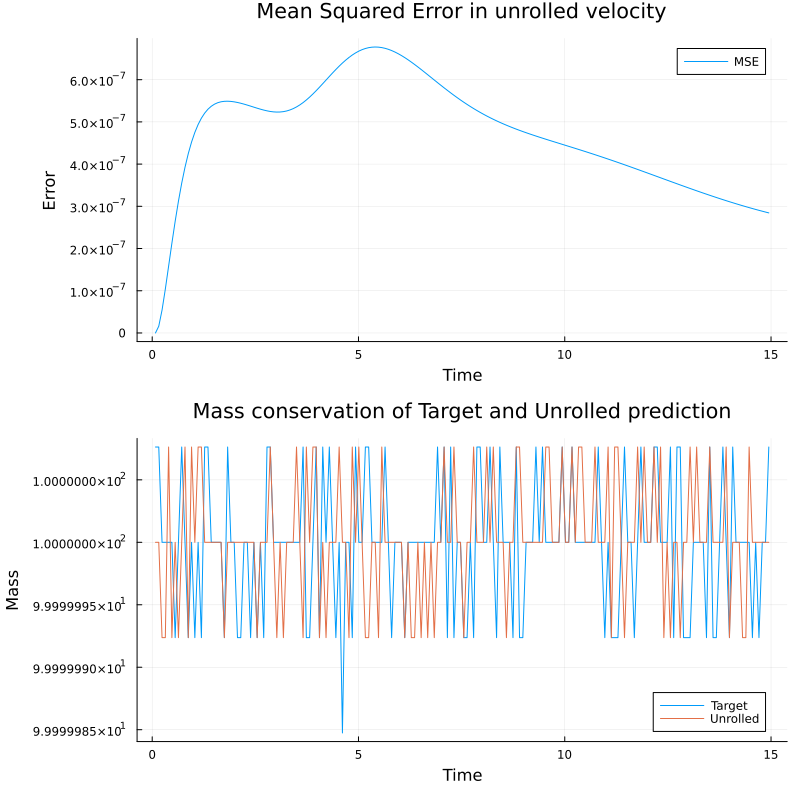

In [4]:
display("image/png", read("media/flux_mass_conserving.png"))

I want to quantify the comparison between the base model and the flux prediction model. I run both models on 400 different seeds, on the standard settings, and calculate the average error, and the number of seeds that blow up (defined by the error going beyond a certain cutoff)

My initial thoughts were correct, the model is capable of achieving a lower error, but at the cost of a much higher chance of blowing up.

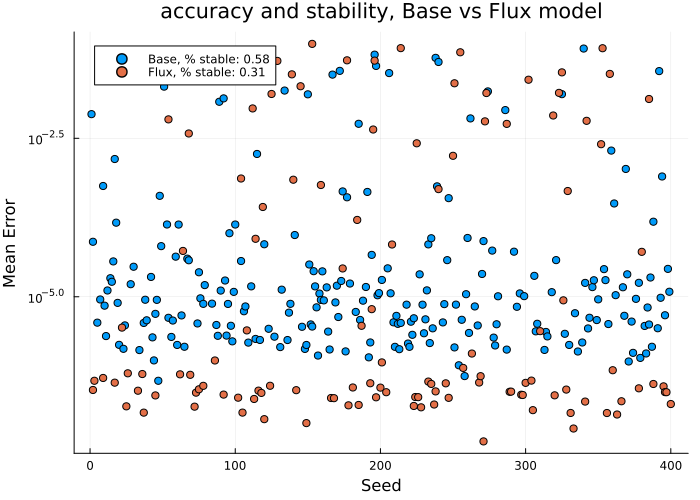

In [5]:
display("image/png", read("media/base_vs_flux.png"))

Now that we have a nice target solution, I want to fix the problem of oscillation explosion in the flux prediction model. Currently, the flux prediction model, is a lot more prone to explosion than the non flux based model, even on the mass conserving target solution. The first thing I will try to make the model more robust, is to add a small amount of noise to the input data, to simulate the beginning of oscillation forming. Hopefully the model can then learn to surpress these oscillations. The noise is defined like this: 
noised = ((rand(nx).-0.5)*2*noise_strength) .+ copy(current_u), so that we get noise in the interval [-noise_strength, noise_strength].

The model is now very stable. I tried 10 different seeds, at a noise strength of 0.01, and none of them gave weird oscillations. Now we have a new issue though, and that is with the accuracy. The model is now 3 orders of magnitude less accurate. Using larger noise strengths also makes it so the model just diffuses more than it should.

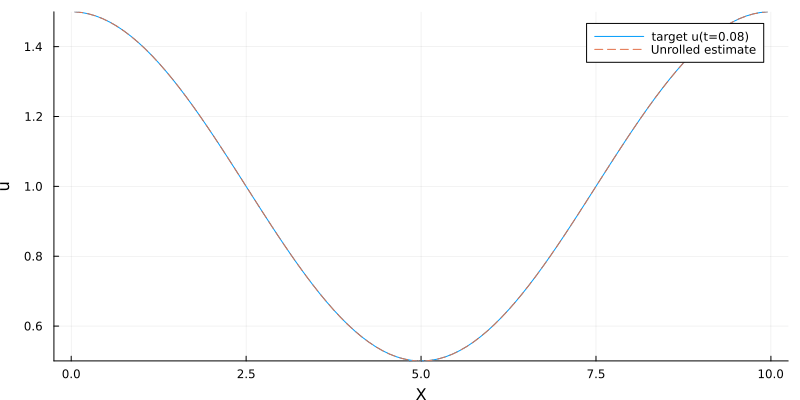

In [7]:
display("image/gif", read("media/added_noise.gif"))

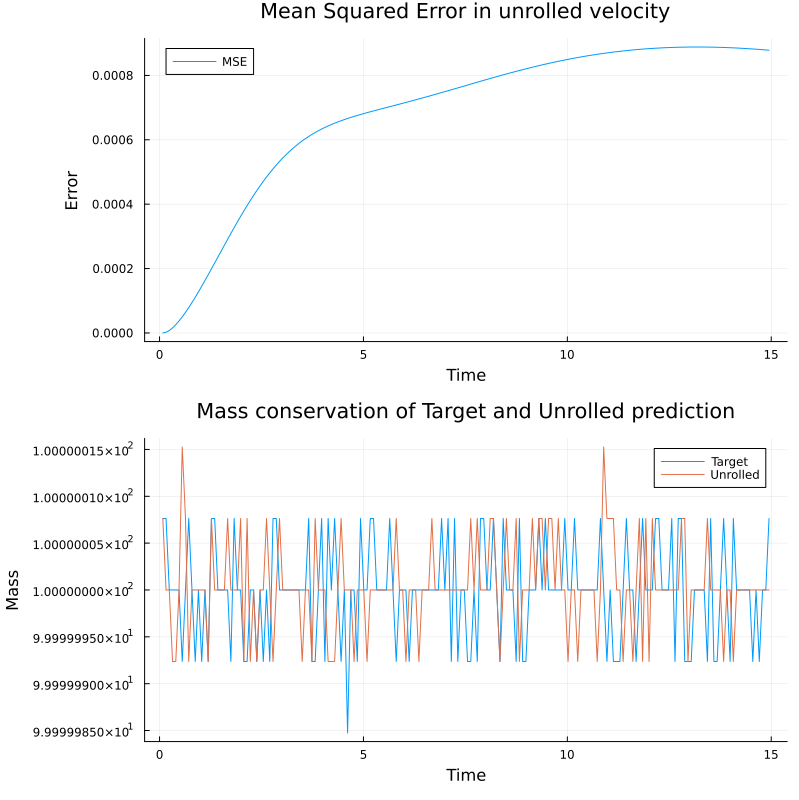

In [8]:
display("image/png", read("media/added_noise.png"))

I now play around with the noise strength a bit to see if we can still get stable solutions with very low noise.

Yes we can definitely push the noise to be very low. The limit seems to be about 0.0002, which is shown here. Going to 0.0001 gave me about a 50-50 chance of blowing up, but at 0.0002 I have not seen any seed blow up. Now we get the stability of the noise adding procedure, but with the accuracy of the no-noise data. My hypothesis, is that the noise strength is related to the maximum allowed error between consecutive timesteps. The shown result is at a strength of 0.0002.

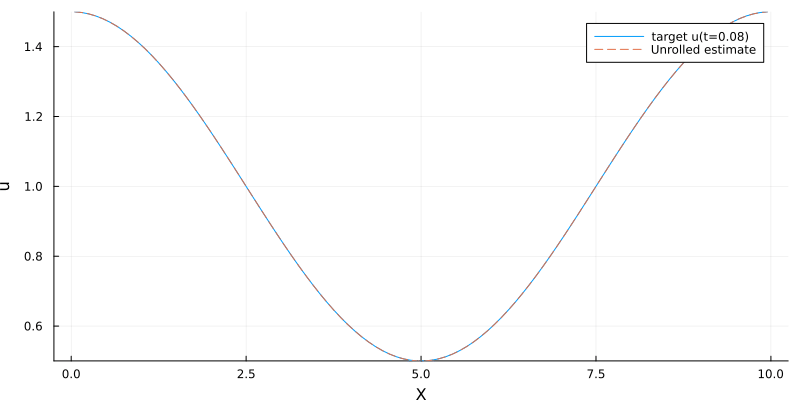

In [5]:
display("image/gif", read("media/low_noise.gif"))

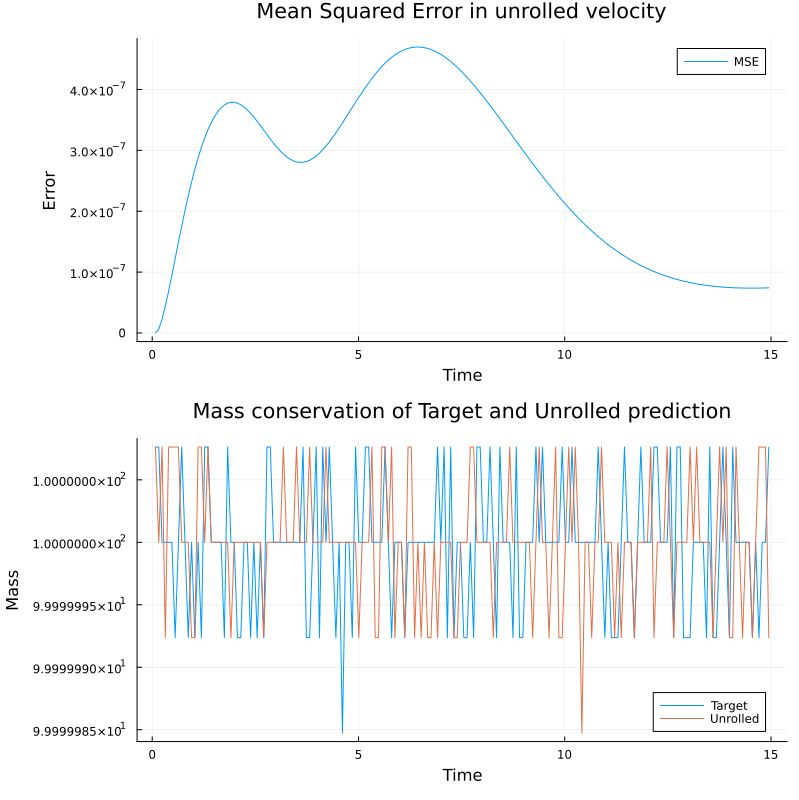

In [6]:
display("image/png", read("media/low_noise.png"))

Here is an very cool result I came by when testing at a noise strength of 0.0001. (This is not enough noise for consistent stability)

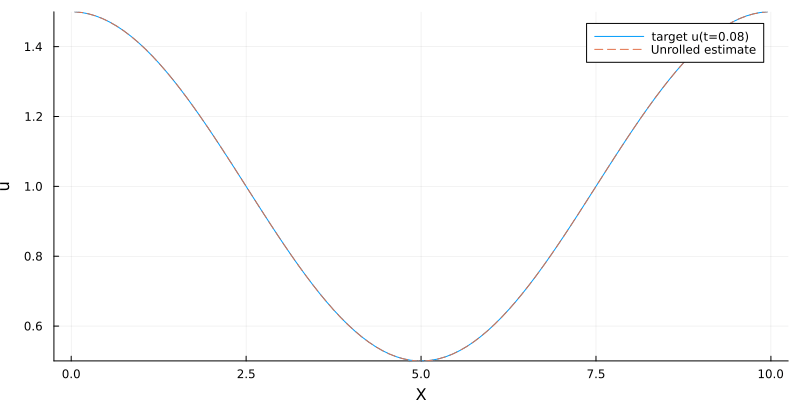

In [9]:
display("image/gif", read("media/surpressed.gif"))

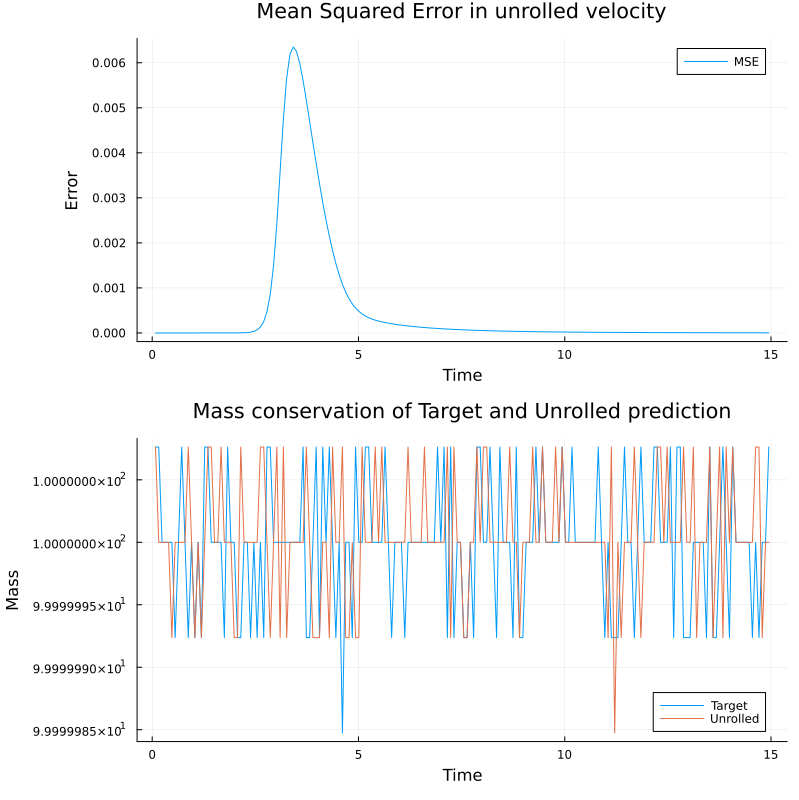

In [10]:
display("image/png", read("media/surpressed.png"))

I now want to get the same graph as before, but now with the noisy training data added. Here I use noise_strength=0.0005. I also do 400 seeds for every combination of model and training data.

We get exactly what we were after, the flux based model with noisy training data has the best accuracy, but also a 100% stability.

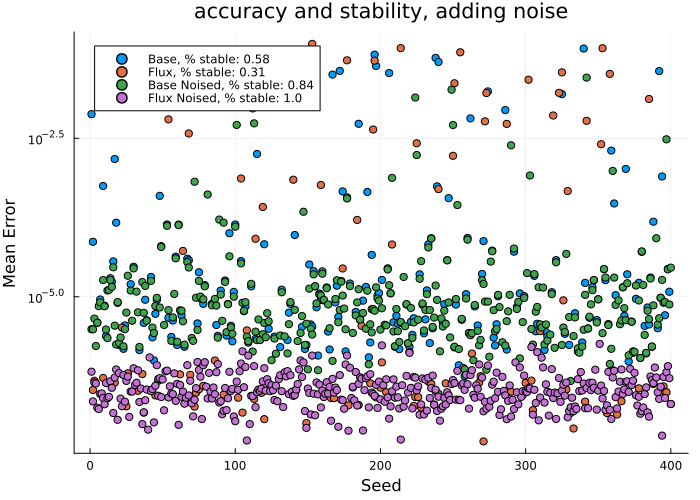

In [6]:
display("image/png", read("media/noising_comparison.png"))

We can also compare the accuracy and stability across different amounts of noise.

We can see the expected behaviour. A large noise strength causes large error, but stable rollouts. A small noise strength causes small errors, but unstable rollouts. Picking a good middlepoint (in this case 0.0003) is important.

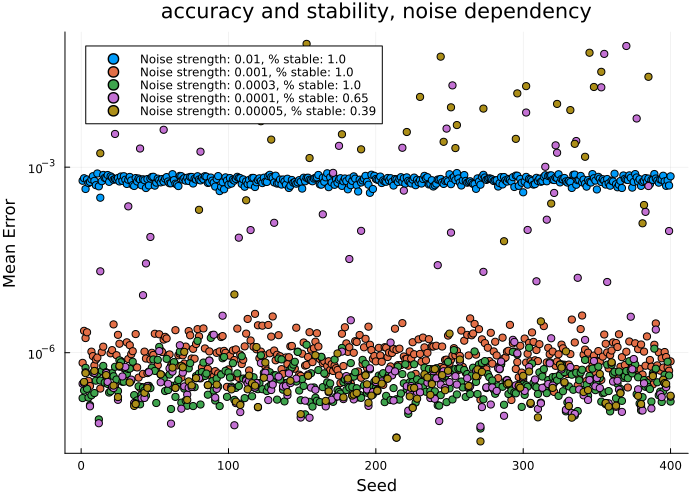

In [4]:
display("image/png", read("media/noise_dependency.png"))

Thus far we have only tested on denoised versions of the training data. I now want to also test how well this model is able to generalize to input data generated from different initial conditions. I do the same trainings as before, with a noise strength of 0.0005, but after the model is trained, I now test on data with initial conditions with double the frequency, and a 0.9 amplitude respectively.

Our new model with noisy data still performs the best, but worse than on its own denoised training data. We also see that the accuracy is not 100% anymore. Especially on the test data with 0.9 amplitude, the model seems to struggle quite a bit. The error is significantly higher, and stability definitely took a hit. Enriching the dataset with more initial conditions might remedy this.

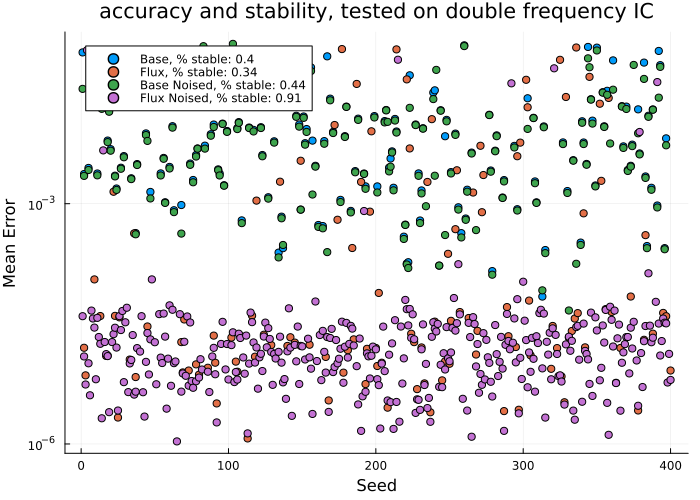

In [1]:
display("image/png", read("media/comparison_freq.png"))

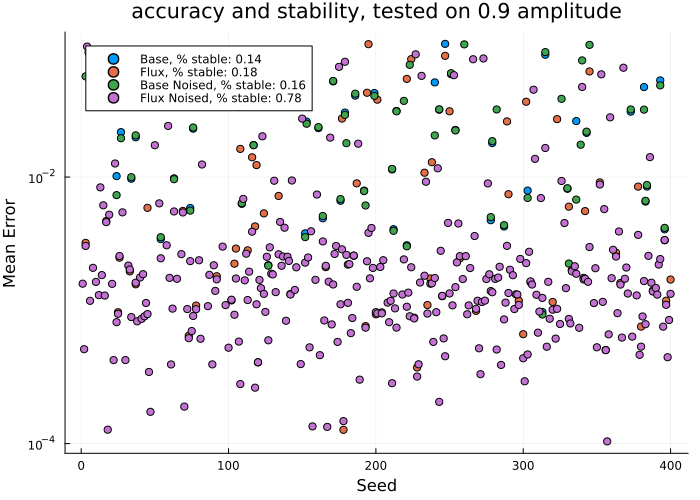

In [2]:
display("image/png", read("media/comparison_amp.png"))

The upcoming week I plan to work on a different aspect of the burgers equation, scaling invariance. From the equation we can reason that the burgers equation is invariant under the scaling: $u(x,t) \rightarrow \tilde{u}(x,t) = \lambda u (\lambda x, \lambda^2 t)$. Therefore, if we train our model to timestep by $\Delta t_0$, and the timestep that we actually want is $\Delta t$, we can use $\lambda = \sqrt{\frac{\Delta t}{\Delta t_0}}$. The trick is then this: in the scaled space, timestepping by $\Delta t_0$ corresponds to timestepping by $\Delta t$ in the original space. So if we scale, timestep, scale back, we can take any timestep we want.